## MINIPROYECTO 1: Análisis Multivariado de Señales Sismográficas

Vanessa Jaramillo Sánchez

Jonny Taborda Acosta

Carlos Andres Posada Chica

*Tratamiento de Señales III*

*Facultad de Ingeniería*

*Prof. Hernán Felipe García*

*2021*

In [1]:
!pip install pyts



     |████████████████████████████████| 2.5MB 6.7MB/s 


In [2]:
import numpy as np
import matplotlib.pyplot as plt
from pyts.decomposition import SingularSpectrumAnalysis
import scipy.io as sc
from scipy.signal import stft, bode, butter, lfilter,freqz
from scipy import signal
import pandas as pd
import seaborn as sns


# Filtros

En el siguiente bloque de código definimos diferentes filtros de los cuales escogeremos uno para trabajar. 

In [3]:
from scipy.signal import butter, lfilter

def butter_bandpass(lowcut, highcut, fs, order):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return b, a


def butter_bandpass_filter(data, lowcut, highcut, fs, order):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = lfilter(b, a, data)
    return y

def butter_lowpass(cutoff, fs, order):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = butter(order, normal_cutoff, btype='low', analog=False)    
    return b, a

def butter_lowpass_filter(data, cutoff, fs, order):
    b, a = butter_lowpass(cutoff, fs, order=order)
    y = lfilter(b, a, data)
    return y
def butter_lowpass_bode (b ,a):
    angularFreq, freqResponse, phaseResponse = scipy.signal.bode(scipy.signal.lti(b, a))

    return angularFreq, freqResponse, phaseResponse

def butter_bandpass_bode (b ,a):
    angularFreq, freqResponse, phaseResponse = scipy.signal.bode(scipy.signal.lti(b, a))

    return angularFreq, freqResponse, phaseResponse

## Trabajaremos en tres secciones dependiendo del tipo de sismo (Local, Regional y Telesismo)

# Sismo Local

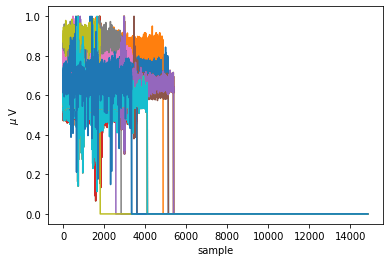

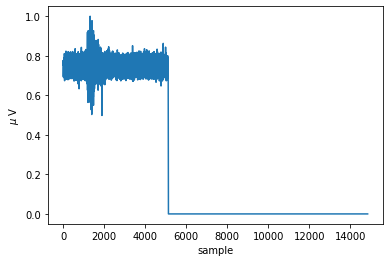

In [4]:
dataLoc = sc.loadmat('sisLoc.mat')#retorna los datos que lee de matlab
dataLoc.keys() # variables del diccionario

Y = dataLoc['Y']# variables
fs1 = dataLoc['fs']#frecuencia de emuestreo que regista el acelerometro

plt.plot(Y.T)#trasponer
plt.xlabel('sample')
plt.ylabel('$\mu$ V')
plt.show()
sampleSignal = Y[0,:] # se extrae una señal de la base de datos
plt.figure
plt.plot(sampleSignal)
plt.xlabel('sample')
plt.ylabel('$\mu$ V')
plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  app.launch_new_instance()


<Figure size 432x288 with 0 Axes>

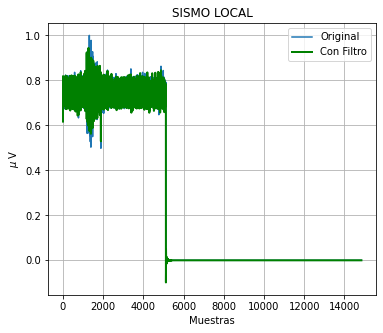

In [5]:
#------------------------------------------------------fILTRADO
#-------------------------------------------------PASA BAJAS
fsnull = 102.0 #Debe cumplir el principio de Nyquist
lowcutnull = 1
highcutnull = 50
ordernull = 6

signalFilteredLocnull = np.zeros((21,14848))

for i in range(0,21):
  signalFilteredLocnull[i,:] = butter_lowpass_filter(Y[i,:],highcutnull, fsnull, ordernull)

plt.figure()
plt.figure(figsize=(20,5))
plt.subplot(1,3,1), plt.plot(Y[0,:], label='Original');
plt.subplot(1,3,1), plt.plot(signalFilteredLocnull[0,:],'g',linewidth=2, label='Con Filtro');
plt.title("SISMO LOCAL"), plt.xlabel('Muestras'),plt.ylabel('$\mu$ V')
plt.grid()
plt.legend()




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  from ipykernel import kernelapp as app


<Figure size 432x288 with 0 Axes>

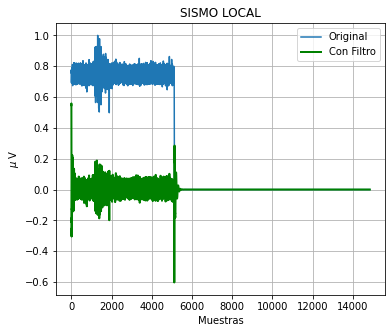

In [6]:
#-------------------------------------------------PASA BANDAS
fs = 102.0 #Debe cumplir el principio de Nyquist
lowcut = 1
highcut = 50
order = 6

signalFilteredLoc = np.zeros((21,14848))

for i in range(0,21):
 signalFilteredLoc[i,:] = butter_bandpass_filter(Y[i,:], lowcut, highcut, fs, order)

plt.figure()
plt.figure(figsize=(20,5))
plt.subplot(1,3,1), plt.plot(Y[0,:], label='Original');
plt.subplot(1,3,1), plt.plot(signalFilteredLoc[0,:],'g',linewidth=2, label='Con Filtro');
plt.title("SISMO LOCAL"), plt.xlabel('Muestras'),plt.ylabel('$\mu$ V')
plt.grid()
plt.legend()

Inicialmente se implementa un filtro PASA BAJAS, identificamos que la mayor parte de energía se concentra en el cero frecuencial haciendo que en los espectogramas fuera difícil identificar el comportamiento de la señal, ademas, obteniendo ceros de energía en los valores de máxima frecuencia en la matriz concatenada, por tal motivo se decide trabajar con un filtro PASA BANDAS, donde el comportamiento de la señal toma mas relevancia tanto en los espectogramas como en los valores de la matriz concatenada.

<Figure size 432x288 with 0 Axes>

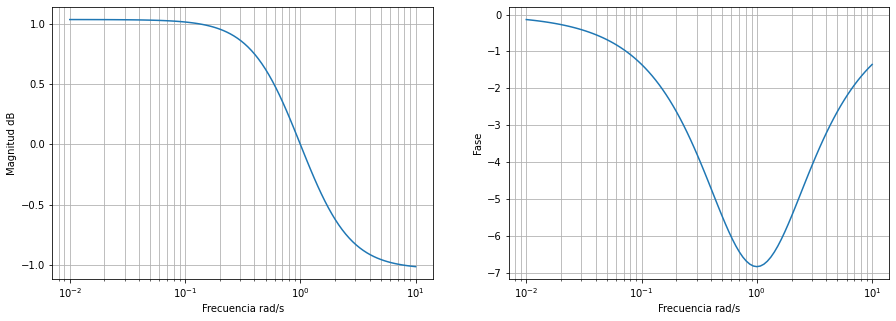

In [7]:
#---------------------------------------------GRAFICA MAGNITUD Y FASE
b,a= butter_lowpass(highcut, fs,order)
sys = (b,a) # Creamos el sistema
w, mag, phase = signal.bode(sys) # Diagrama de bode: frecuencias, magnitud y fase


#plt.semilogx(w, mag) # Eje x logarítmico
#plt.semilogx(w, phase) # Eje x logarítmico

plt.figure()
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.semilogx(w,mag)
plt.xlabel('Frecuencia rad/s')
plt.ylabel('Magnitud dB')
plt.grid(True, which="both")

plt.subplot(1,2,2)
plt.semilogx(w,phase)
plt.xlabel('Frecuencia rad/s')
plt.ylabel('Fase')
plt.grid(True, which="both")



## Separar las señales

<function matplotlib.pyplot.show>

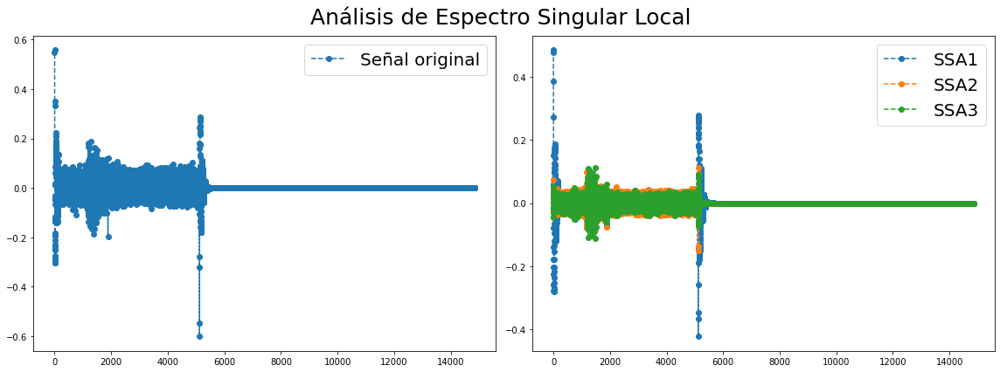

In [8]:
LOCAL = signalFilteredLoc
Grup= 3
SSA= SingularSpectrumAnalysis(window_size=Grup)
LOCALssa = SSA.fit_transform(LOCAL)
plt.figure(figsize=(16,6))
idsignal = 0
plt.suptitle('Análisis de Espectro Singular Local',fontsize=25)

ax1=plt.subplot(121)
ax1.plot(LOCAL[idsignal], 'o--', label= 'Señal original')
ax1.legend(loc='best', fontsize=20)
ax2=plt.subplot(122)
for i in range(Grup):
  ax2.plot(LOCALssa[idsignal, i],'o--', label= 'SSA{0}'.format(i+1))
ax2.legend(loc='best', fontsize=20)

plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.show

(<matplotlib.axes._subplots.AxesSubplot at 0x7ff689985490>,
 [<matplotlib.lines.Line2D at 0x7ff6920e0e90>])

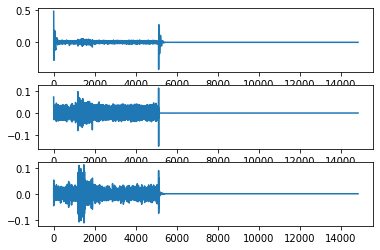

In [9]:
plt.subplot(3,1,1),plt.plot(LOCALssa[idsignal, 0])
plt.subplot(3,1,2),plt.plot(LOCALssa[idsignal, 1])
plt.subplot(3,1,3),plt.plot(LOCALssa[idsignal, 2])

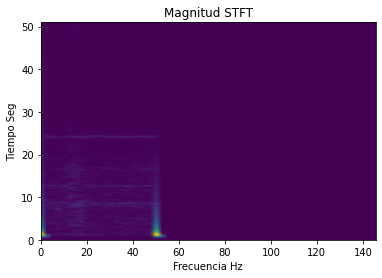

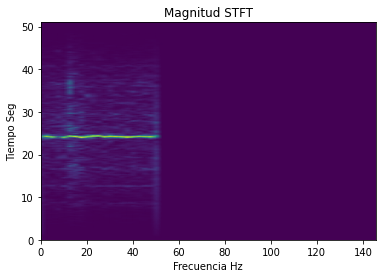

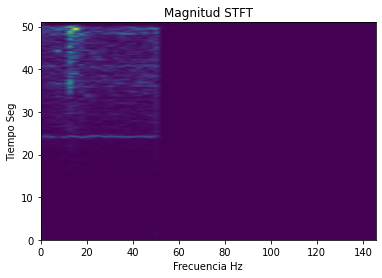

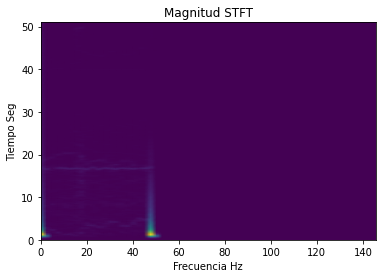

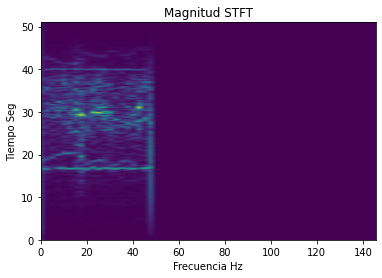

...

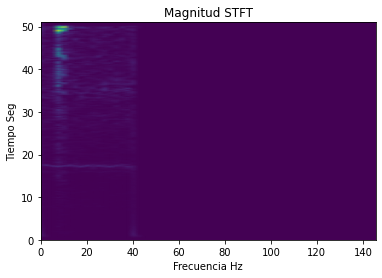

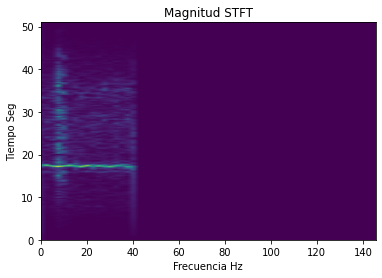

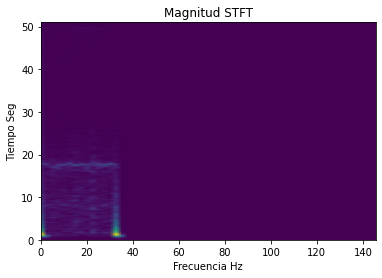

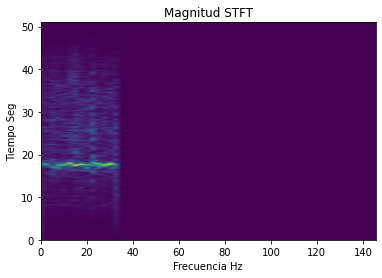

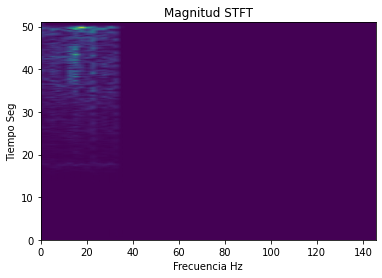

In [10]:
#-----------------------------------------------Analisis en Frecuencia
#STFT
for i in range (0,21):
  #print('STFT para las señales:', i+1)
  for j in range (0,3):
    #plt.figure(1, figsize=(20, 60))
    fL,tL,ZxxL= signal.stft(LOCALssa[i,j],fs,nperseg=512)
    absZxx = np.abs(ZxxL)
    #plt.subplot(21, 3, i + j + 1)
    plt.pcolormesh(tL,fL,absZxx, shading='gouraud')
    plt.title('Magnitud STFT')
    plt.xlabel('Frecuencia Hz')
    plt.ylabel('Tiempo Seg')
    plt.show()
    #print(absZxx)


In [11]:
#Funcion para el cálculo de la energía.
def signalEnergy(signalInput):
  sum = 0
  for k in range(len(signalInput)):
    sum+=pow(signalInput[k],2)     
  sigEnergy = sum
  return sigEnergy 

In [12]:
#Función para obtener las carateristicas
def extract_features(Zxx, f, ssa):
  # En la matriz Zxx se tiene una matriz de #defrecs * #times
  # Zxx[i,j], sería el espectro en la frecuencia[i] y el tiempo [j]  
  absZxx = np.abs(Zxx)
  #print(absZxx)
  maxP = np.max(absZxx)
  #print('Potencia máx:',maxP)
  id = np.where(absZxx==maxP)
  frecPmax = np.squeeze(f[id[0]])
  #print('Frecuencia de Pmáx:',frecPmax)
  energy=signalEnergy(ssa)
  #print('Energia:',energy)
  maxF = np.max(absZxx,axis=1)
  meanP = np.mean(maxF)
  #print('Media:',meanP)
  varP = np.var(maxF)
  #print('Varianza:',meanP)
  maxSpectrum = np.max(maxF)
  minSpectrum = np.min(maxF)

  datos = np.random.rand(7)
  datos[0] = maxP
  datos[1]= frecPmax
  datos[2] = energy
  datos[3] = meanP
  datos[4] = varP
  datos[5] = maxSpectrum
  datos[6] = minSpectrum

  return datos  

In [13]:
#-------------------------------------------------------------CARACTERISRICAS
datosLoc=np.zeros((21,21))
for i in range (0,21):
  datofila = np.zeros((0,0))
  for j in range (0,3):
    fL,tL,ZxxL= signal.stft(LOCALssa[i,j],fs,nperseg=512)
    DATOS = extract_features(ZxxL,fL,LOCALssa[i,j])
    datofila = np.append(datofila,DATOS) 
  datosLoc[i:] = datofila
print( datosLoc)

[[3.08146162e-02 1.39453125e+00 5.85592738e+00 3.37285888e-03
  2.39796538e-05 3.08146162e-02 1.12292225e-04 1.10259206e-02
  2.41054688e+01 1.89342358e+00 1.42800919e-03 1.84711645e-06
  1.10259206e-02 1.08465671e-04 9.94120447e-03 4.96054688e+01
  1.46366777e+00 1.53569367e-03 3.74186033e-06 9.94120447e-03
  8.12525539e-06]
 [3.50748942e-02 1.39453125e+00 6.95116513e+00 3.88423629e-03
  3.13497379e-05 3.50748942e-02 2.32522134e-04 4.96741882e-03
  2.98828125e+01 8.15062207e-01 1.35270281e-03 7.16786319e-07
  4.96741882e-03 2.65465040e-04 8.49938354e-03 4.98046875e+01
  9.93922947e-01 1.20128757e-03 1.74184105e-06 8.49938354e-03
  2.71257232e-05]
 [2.02270719e-02 4.96054688e+01 3.07806418e+00 2.94262833e-03
  1.17846949e-05 2.02270719e-02 5.94147270e-05 1.52289860e-02
  1.39453125e+00 1.70970624e+00 2.39221025e-03 6.43890997e-06
  1.52289860e-02 1.53181923e-04 7.32699863e-03 3.02812500e+01
  1.05812366e+00 2.18988016e-03 3.21455509e-06 7.32699863e-03
  1.05969742e-04]
 [2.02270719e-02

# Sismo Regional

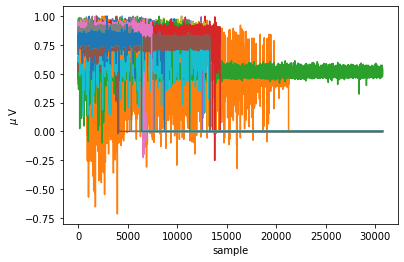

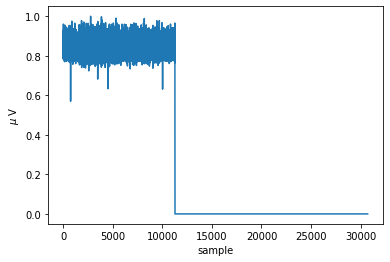

In [14]:
dataReg = sc.loadmat('sisReg.mat')#retorna los datos que lee de matlab
dataReg.keys() # variables del diccionario

X = dataReg['Y']#Son variables
fs = dataReg['fs']#frecuencia de emuestreo que regista el acelerometro

plt.plot(X.T)#trasponer
plt.xlabel('sample')
plt.ylabel('$\mu$ V')
plt.show()

sampleSignal = X[0,:] # se extrae una señal de la base de datos
plt.figure
plt.plot(sampleSignal)
plt.xlabel('sample')
plt.ylabel('$\mu$ V')
plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  from ipykernel import kernelapp as app


<Figure size 432x288 with 0 Axes>

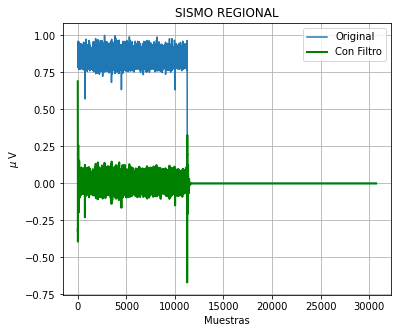

In [15]:
#------------------------------------------------------fILTRADO
fs = 102.0 #Debe cumplir el principio de Nyquist
lowcut = 1
highcut = 50
order = 6

signalFilteredReg = np.zeros((21,30720))

for i in range(0,21):
  signalFilteredReg[i,:] = butter_bandpass_filter(X[i,:], lowcut, highcut, fs, order)

plt.figure()
plt.figure(figsize=(20,5))
plt.subplot(1,3,1), plt.plot(X[0,:], label='Original');
plt.subplot(1,3,1), plt.plot(signalFilteredReg[0,:],'g',linewidth=2, label='Con Filtro');
plt.title("SISMO REGIONAL"), plt.xlabel('Muestras'),plt.ylabel('$\mu$ V')
plt.grid()
plt.legend()

<function matplotlib.pyplot.show>

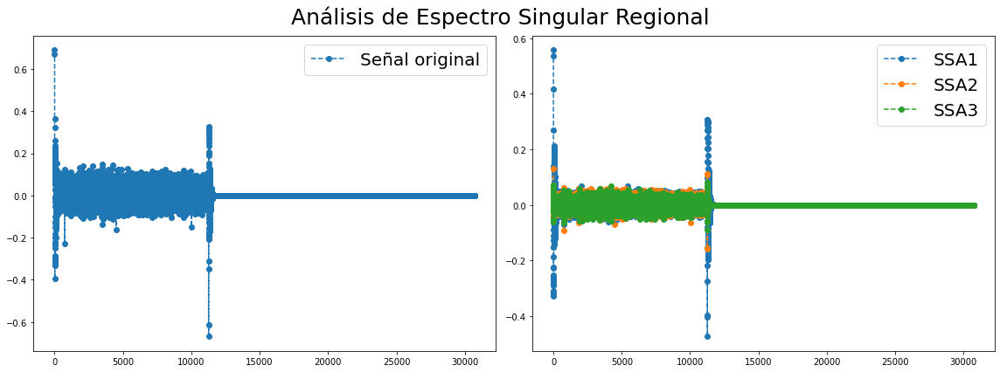

In [16]:
REGIONAL = signalFilteredReg
Grup1= 3
SSA1= SingularSpectrumAnalysis(window_size=Grup1)
REGIONALssa = SSA1.fit_transform(REGIONAL)
plt.figure(figsize=(16,6))
idsignal = 0
plt.suptitle('Análisis de Espectro Singular Regional',fontsize=25)

ax1=plt.subplot(121)
ax1.plot(REGIONAL[idsignal], 'o--', label= 'Señal original')
ax1.legend(loc='best', fontsize=20)
ax2=plt.subplot(122)
for i in range(Grup1):
  ax2.plot(REGIONALssa[idsignal, i],'o--', label= 'SSA{0}'.format(i+1))
ax2.legend(loc='best', fontsize=20)

plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.show

(<matplotlib.axes._subplots.AxesSubplot at 0x7ff69210cf90>,
 [<matplotlib.lines.Line2D at 0x7ff68795b950>])

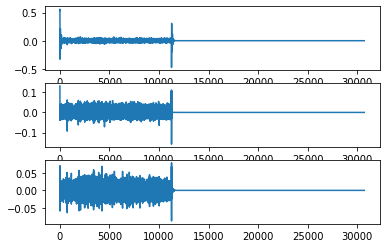

In [17]:
plt.subplot(3,1,1),plt.plot(REGIONALssa[idsignal, 0])
plt.subplot(3,1,2),plt.plot(REGIONALssa[idsignal, 1])
plt.subplot(3,1,3),plt.plot(REGIONALssa[idsignal, 2])

STFT para las señales: 1


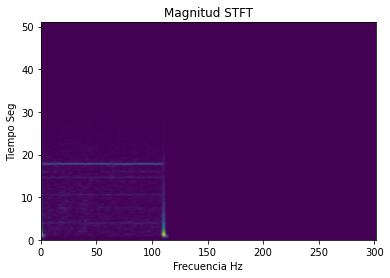

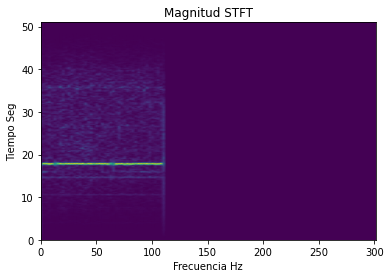

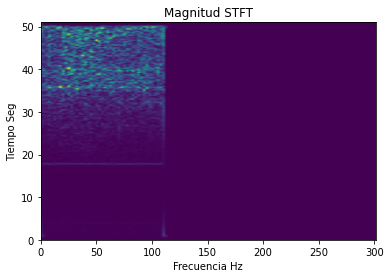

STFT para las señales: 2


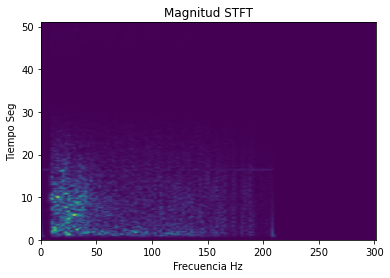

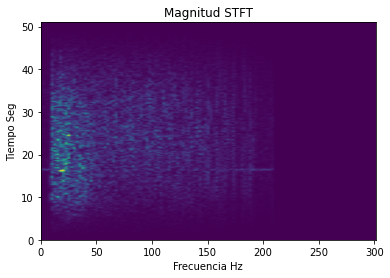

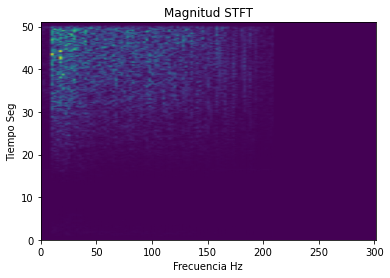

STFT para las señales: 3


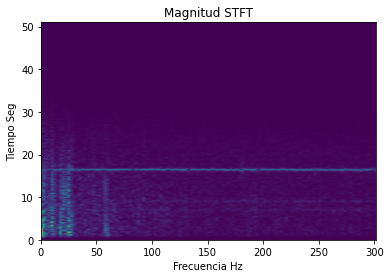

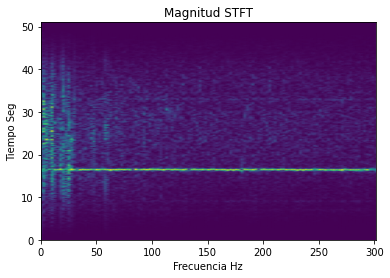

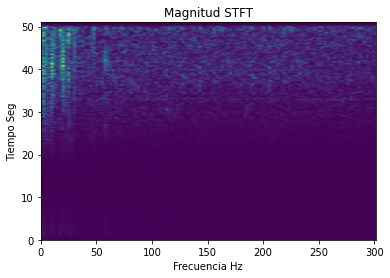

STFT para las señales: 4


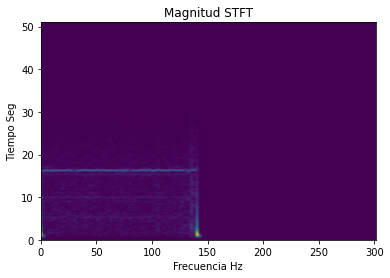

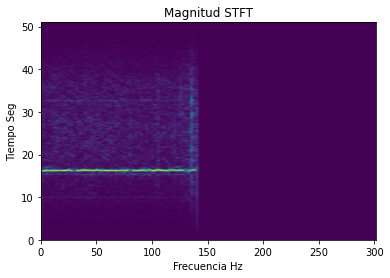

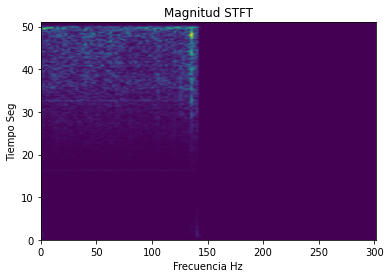

STFT para las señales: 5


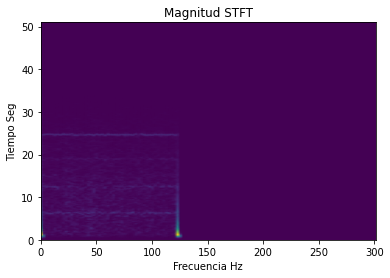

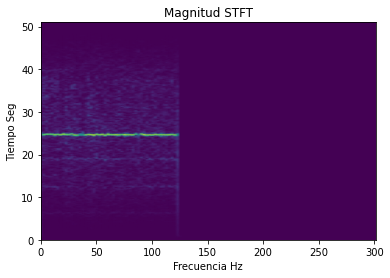

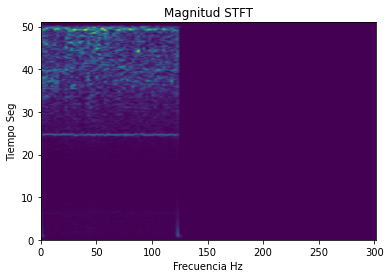

STFT para las señales: 6


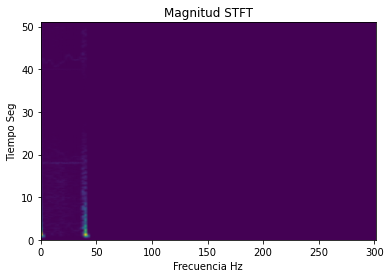

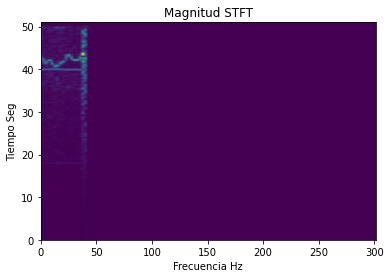

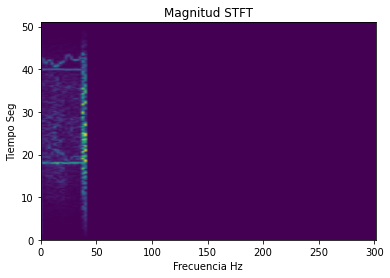

STFT para las señales: 7


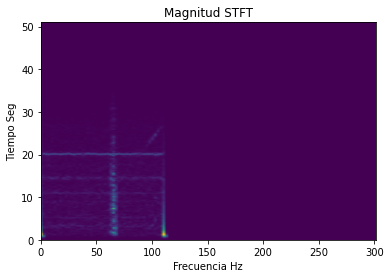

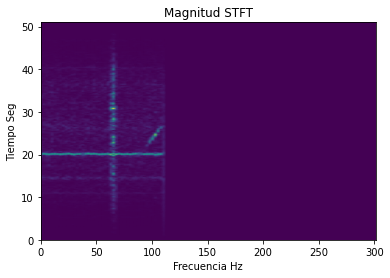

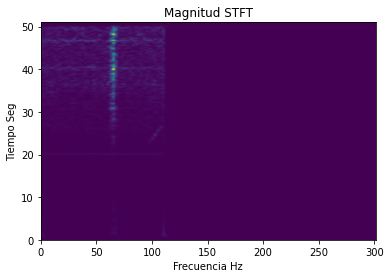

STFT para las señales: 8


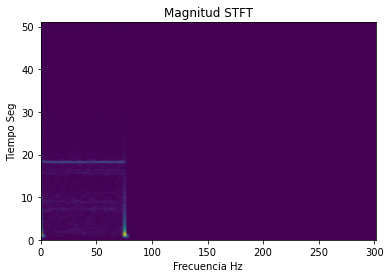

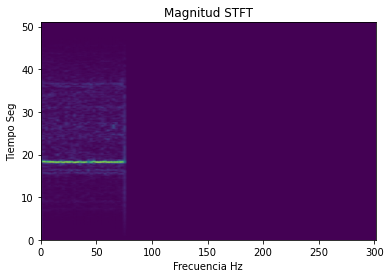

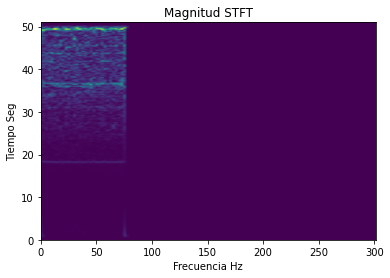

STFT para las señales: 9


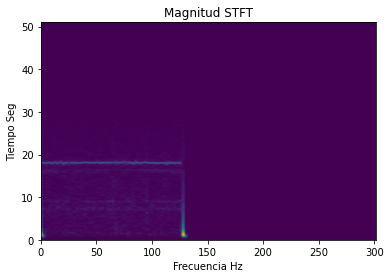

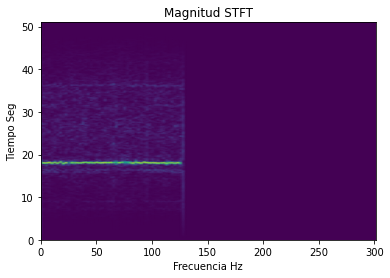

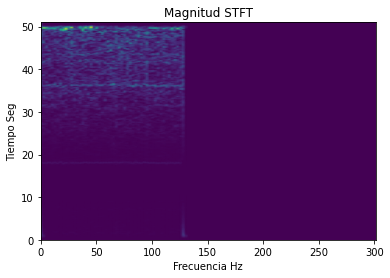

STFT para las señales: 10


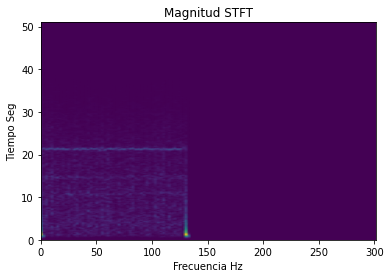

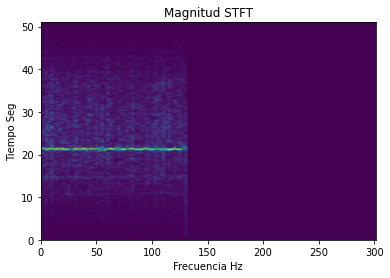

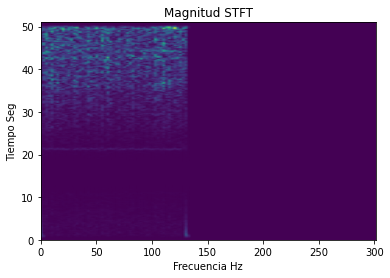

STFT para las señales: 11


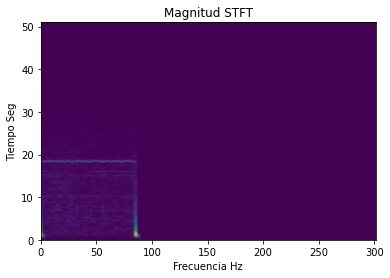

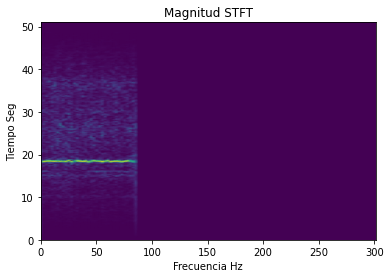

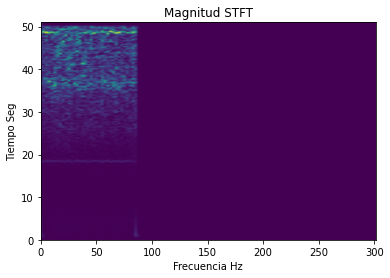

STFT para las señales: 12


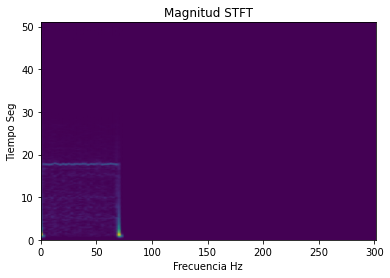

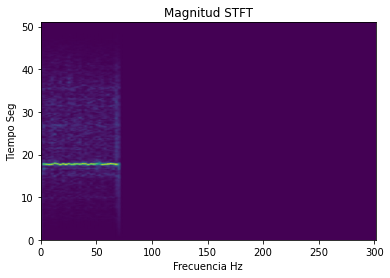

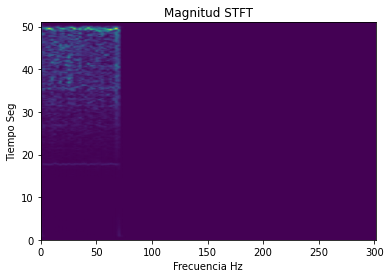

STFT para las señales: 13


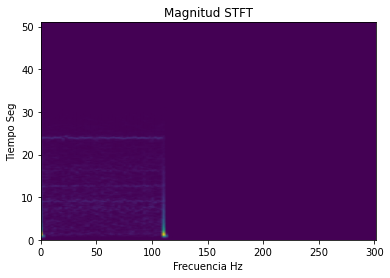

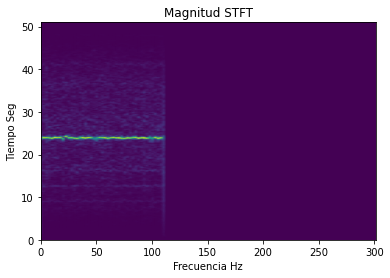

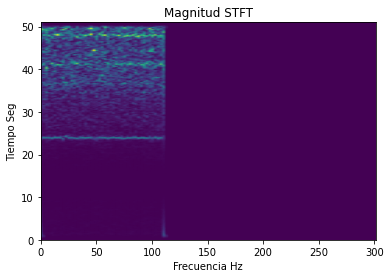

STFT para las señales: 14


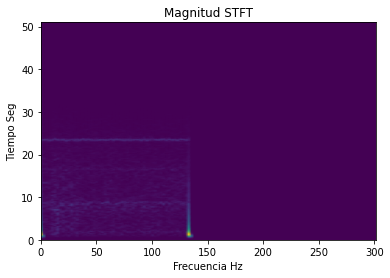

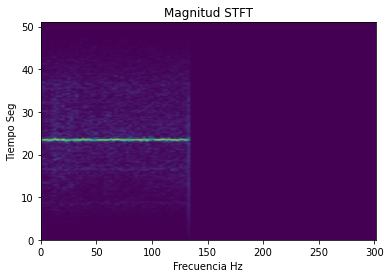

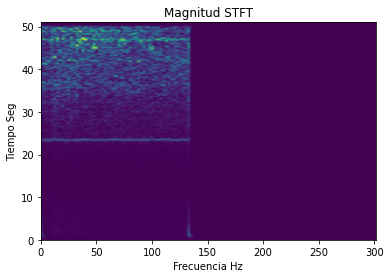

STFT para las señales: 15


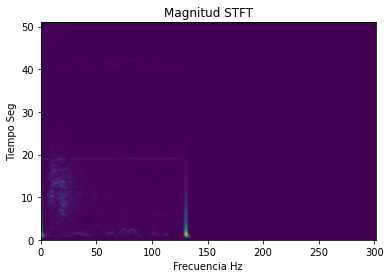

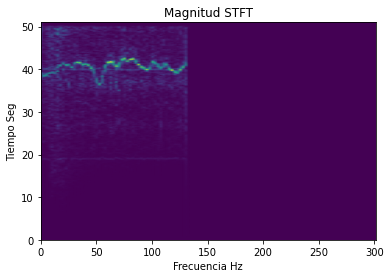

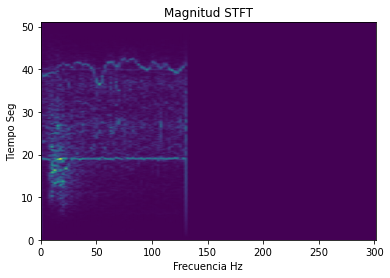

STFT para las señales: 16


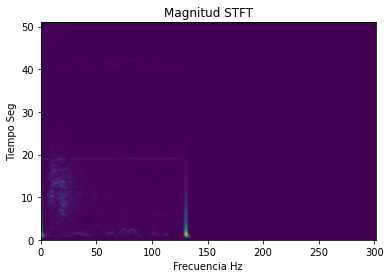

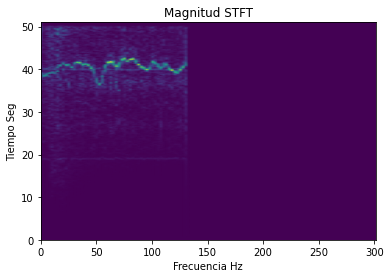

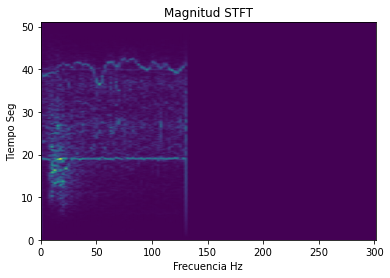

STFT para las señales: 17


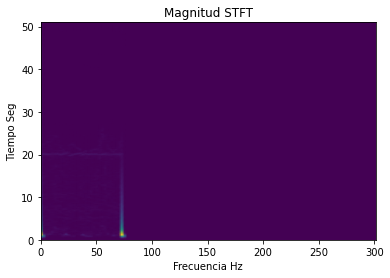

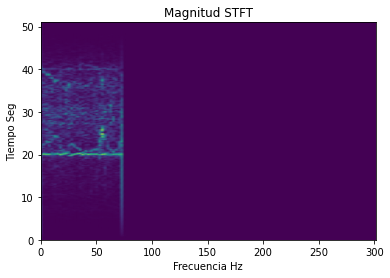

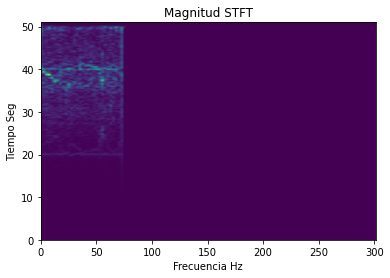

STFT para las señales: 18


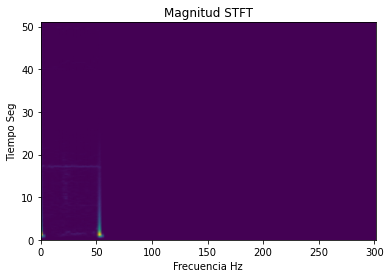

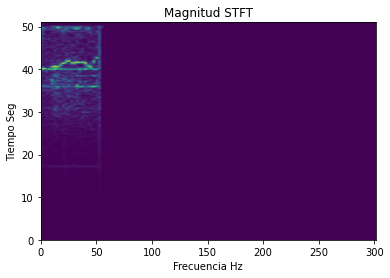

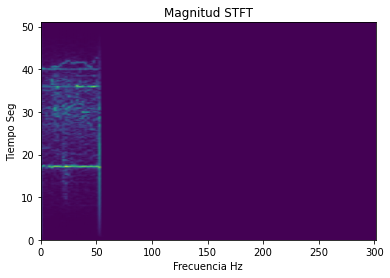

STFT para las señales: 19


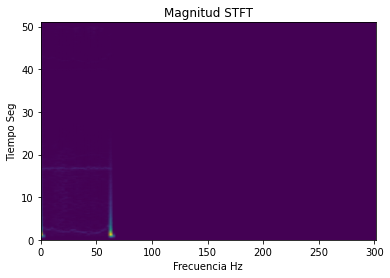

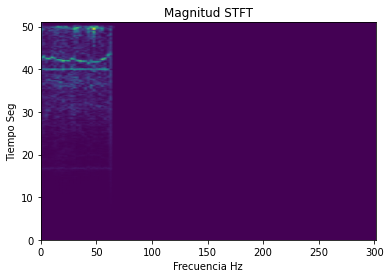

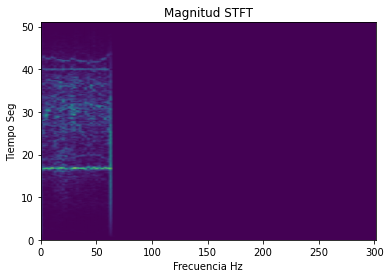

STFT para las señales: 20


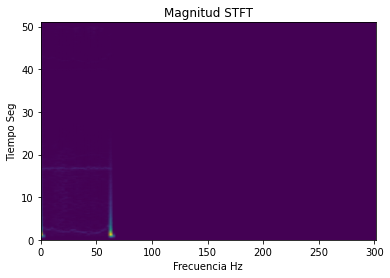

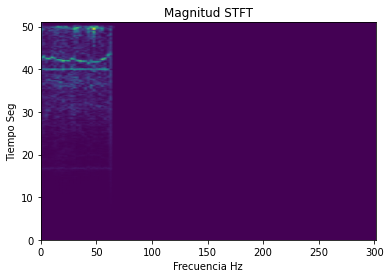

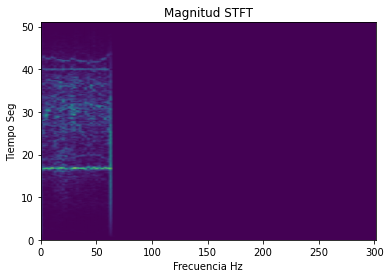

STFT para las señales: 21


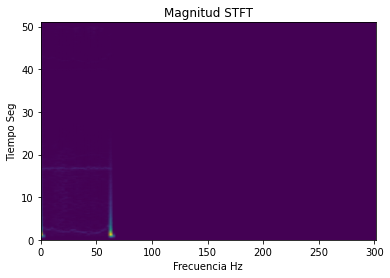

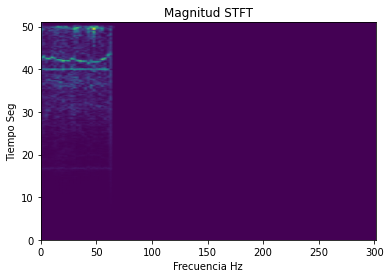

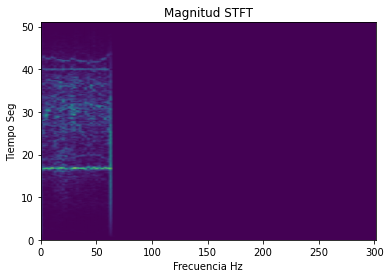

In [18]:
#-----------------------------------------------Analisis en Frecuencia
#STFT
for i in range (21):
  print('STFT para las señales:', i+1)
  for j in range (3):
    fR,tR,ZxxR= signal.stft(REGIONALssa[i,j],fs,nperseg=512)
    absZxx = np.abs(ZxxR)
    plt.pcolormesh(tR,fR,absZxx, shading='gouraud')
    plt.title('Magnitud STFT')
    plt.xlabel('Frecuencia Hz')
    plt.ylabel('Tiempo Seg')
    plt.show()



In [19]:
datosReg=np.zeros((21,21))
for i in range (0,21):
  datofila = np.zeros((0,0))
  for j in range (0,3):
    fR,tR,ZxxR= signal.stft(REGIONALssa[i,j],fs,nperseg=512)
    DATOS = extract_features(ZxxR,fR,REGIONALssa[i,j])
    datofila = np.append(datofila,DATOS) 
  datosReg[i:] = datofila
print( datosReg)

[[3.41326547e-02 1.39453125e+00 9.83081042e+00 3.79205224e-03
  3.04578157e-05 3.41326547e-02 2.63851021e-04 1.15556357e-02
  1.79296875e+01 4.14732288e+00 1.41922951e-03 1.30191202e-06
  1.15556357e-02 2.21152645e-04 4.69840857e-03 3.58593750e+01
  2.60071438e+00 1.26769263e-03 1.69121900e-06 4.69840857e-03
  3.97328634e-05]
 [7.04983550e-02 5.97656250e+00 2.37368192e+02 1.30631325e-02
  2.86954762e-04 7.04983550e-02 1.75999892e-04 3.25415664e-02
  1.63359375e+01 7.54417017e+01 9.23912823e-03 4.75364070e-05
  3.25415664e-02 1.42504039e-04 2.74423230e-02 4.36289062e+01
  6.62420140e+01 6.60848607e-03 4.83345688e-05 2.74423230e-02
  2.02375889e-05]
 [1.86111459e-02 2.19140625e+00 1.32612525e+01 3.47534000e-03
  1.73754004e-05 1.86111459e-02 2.41242896e-04 6.83620641e-03
  1.65351562e+01 6.95027203e+00 2.43602439e-03 2.86588841e-06
  6.83620641e-03 1.31825170e-04 7.16232477e-03 4.14375000e+01
  5.74583891e+00 1.96947090e-03 4.14617302e-06 7.16232477e-03
  3.05887397e-05]
 [3.43818700e-02

# Sismo Tele

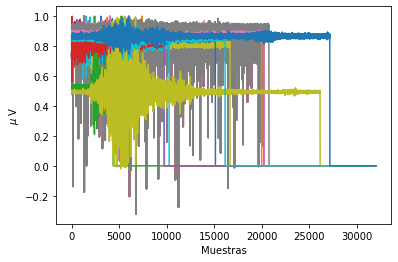

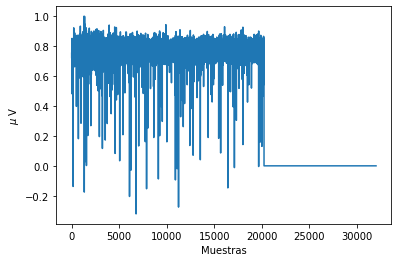

In [20]:
dataTele = sc.loadmat('sisTele.mat')#retorna los datos que lee de matlab
dataReg.keys() # variables del diccionario

Z = dataTele['Y']#Son variables
fs3 = dataTele['fs']#frecuencia de emuestreo que regista el acelerometro

plt.plot(Z.T)#trasponer
plt.xlabel('Muestras')
plt.ylabel('$\mu$ V')
plt.show()

sampleSignal = Z[0,:] # se extrae una señal de la base de datos
plt.figure
plt.plot(sampleSignal)
plt.xlabel('Muestras')
plt.ylabel('$\mu$ V')
plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  from ipykernel import kernelapp as app


<Figure size 432x288 with 0 Axes>

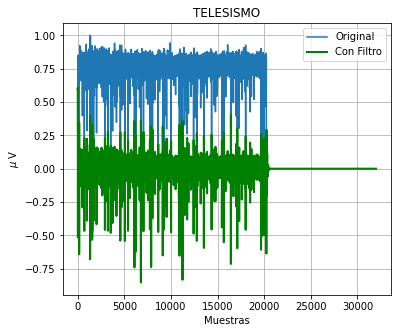

In [21]:
#------------------------------------------------------fILTRADO
fs = 102.0 #Debe cumplir el principio de Nyquist
lowcut = 1
highcut = 50
order = 6

signalFilteredTele = np.zeros((21,32000))

for i in range(0,21):
  signalFilteredTele[i,:] = butter_bandpass_filter(Z[i,:], lowcut, highcut, fs, order)

plt.figure()
plt.figure(figsize=(20,5))
plt.subplot(1,3,1), plt.plot(Z[0,:], label='Original');
plt.subplot(1,3,1), plt.plot(signalFilteredTele[0,:],'g',linewidth=2, label='Con Filtro');
plt.title("TELESISMO"), plt.xlabel('Muestras'),plt.ylabel('$\mu$ V')
plt.grid()
plt.legend()

<function matplotlib.pyplot.show>

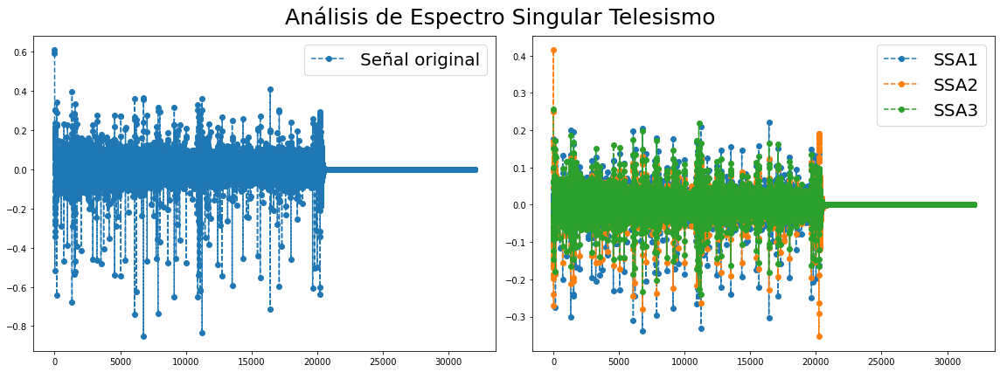

In [22]:
TELESISMO = signalFilteredTele
Grup2= 3
SSA2= SingularSpectrumAnalysis(window_size=Grup2)
TELESISMOssa = SSA2.fit_transform(signalFilteredTele)
plt.figure(figsize=(16,6))
idsignal = 0
plt.suptitle('Análisis de Espectro Singular Telesismo',fontsize=25)

ax1=plt.subplot(121)
ax1.plot(TELESISMO[idsignal], 'o--', label= 'Señal original')
ax1.legend(loc='best', fontsize=20)
ax2=plt.subplot(122)
for i in range(Grup2):
  ax2.plot(TELESISMOssa[idsignal, i],'o--', label= 'SSA{0}'.format(i+1))
ax2.legend(loc='best', fontsize=20)

plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.show

(<matplotlib.axes._subplots.AxesSubplot at 0x7ff689a76b50>,
 [<matplotlib.lines.Line2D at 0x7ff6878d5b50>])

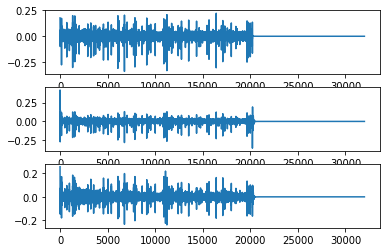

In [23]:
plt.subplot(3,1,1),plt.plot(TELESISMOssa[idsignal, 0])
plt.subplot(3,1,2),plt.plot(TELESISMOssa[idsignal, 1])
plt.subplot(3,1,3),plt.plot(TELESISMOssa[idsignal, 2])

STFT para las señales: 1


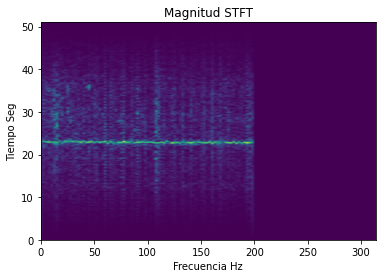

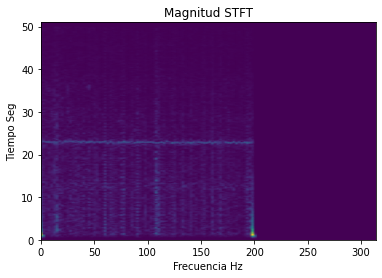

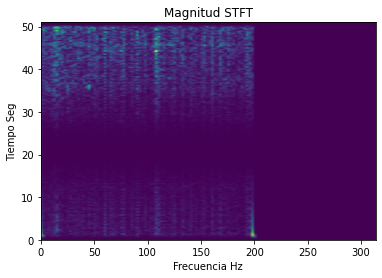

STFT para las señales: 2


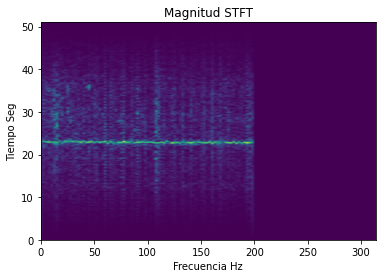

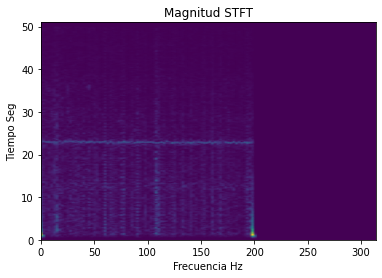

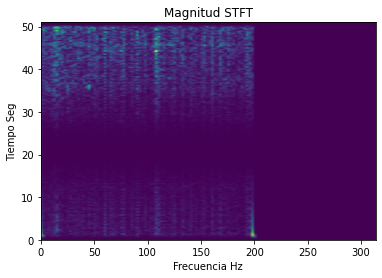

STFT para las señales: 3


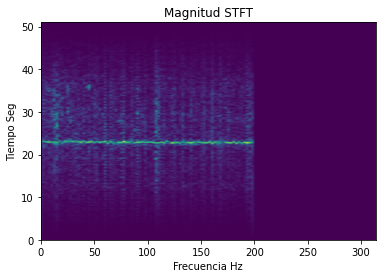

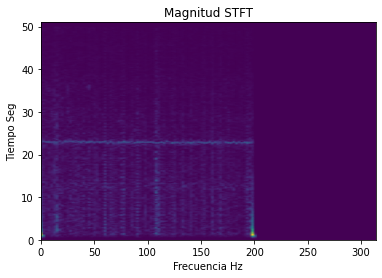

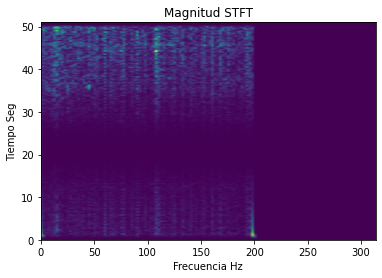

STFT para las señales: 4


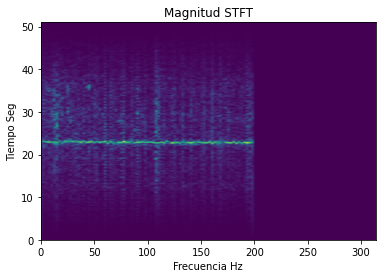

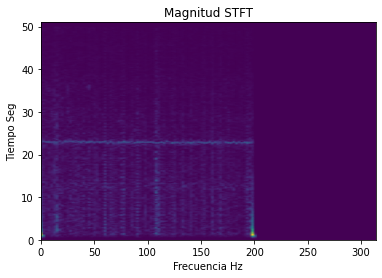

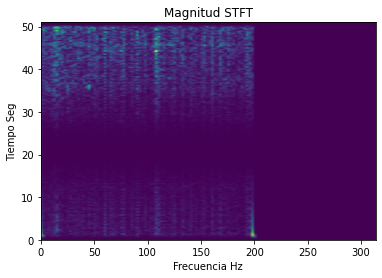

STFT para las señales: 5


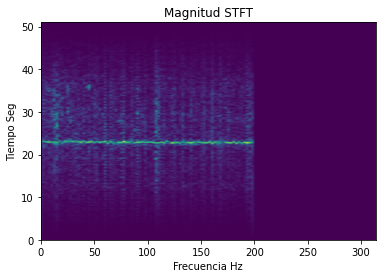

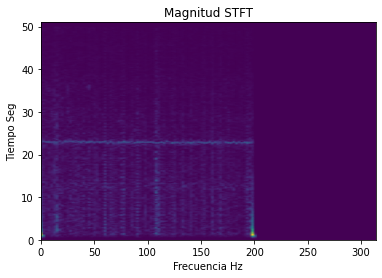

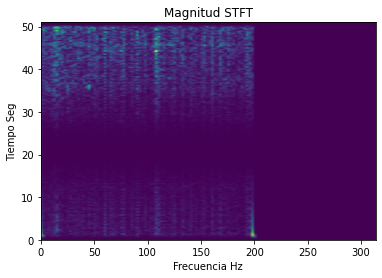

STFT para las señales: 6


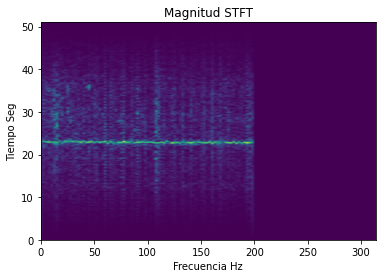

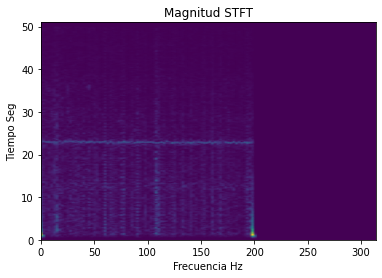

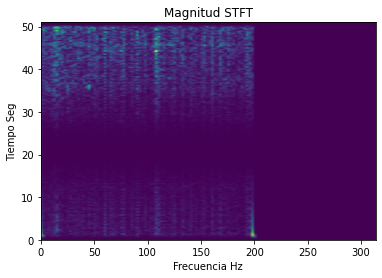

STFT para las señales: 7


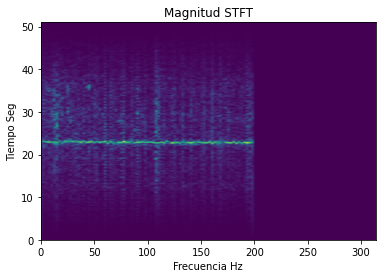

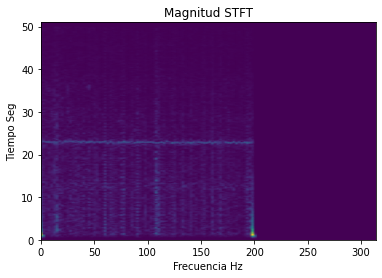

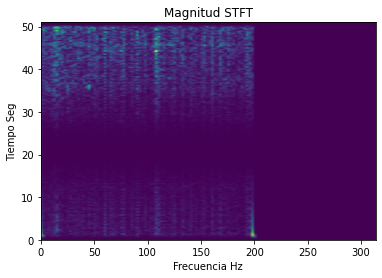

STFT para las señales: 8


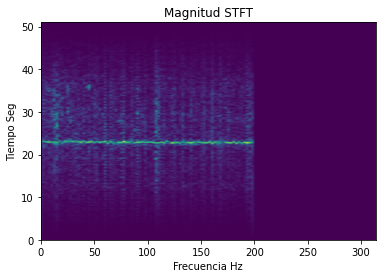

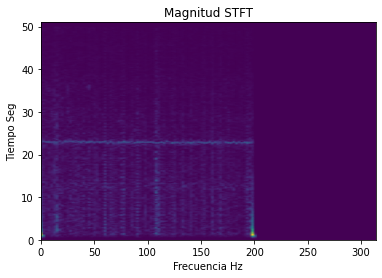

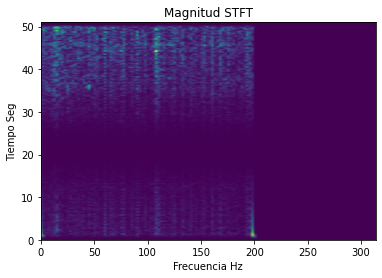

STFT para las señales: 9


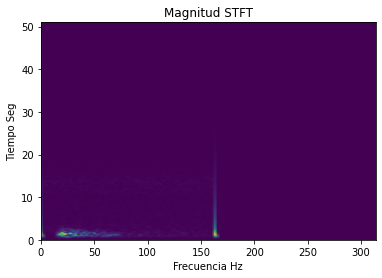

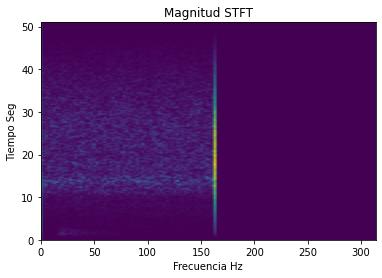

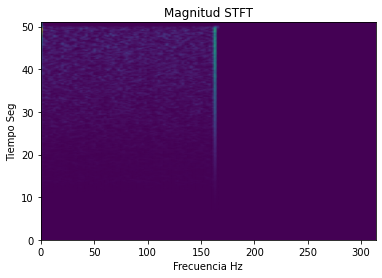

STFT para las señales: 10


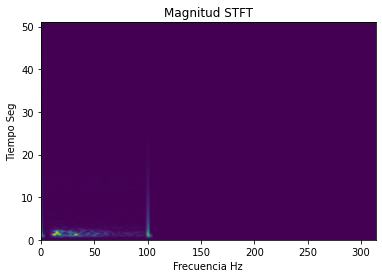

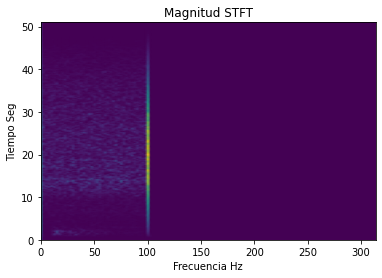

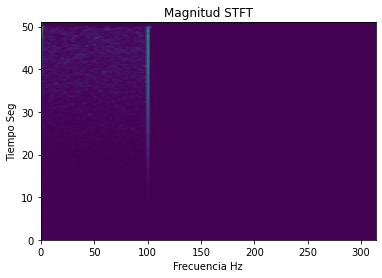

STFT para las señales: 11


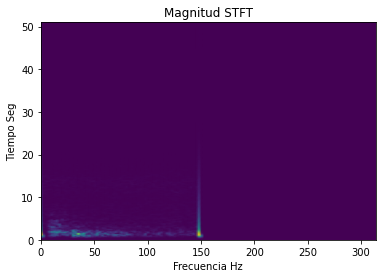

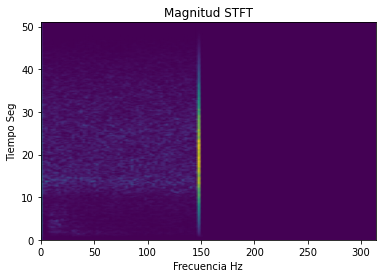

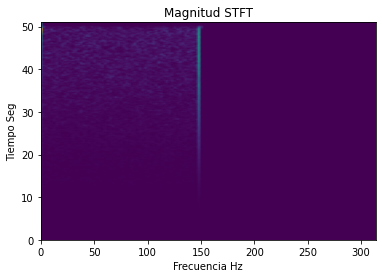

STFT para las señales: 12


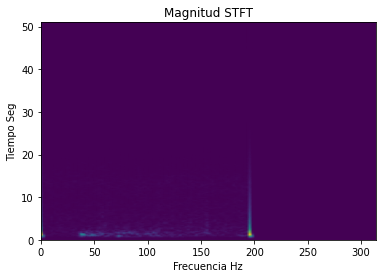

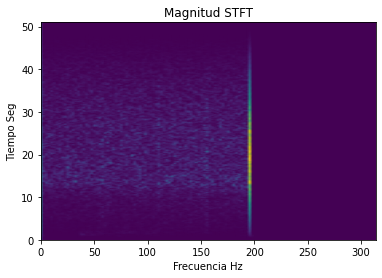

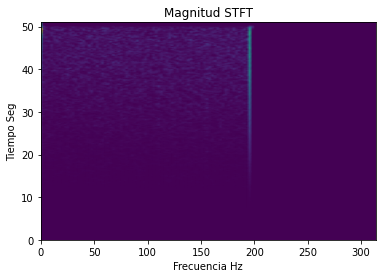

STFT para las señales: 13


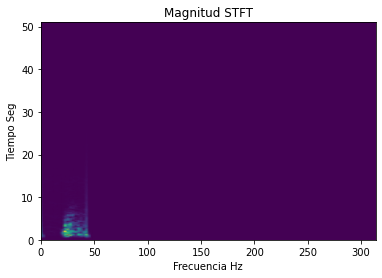

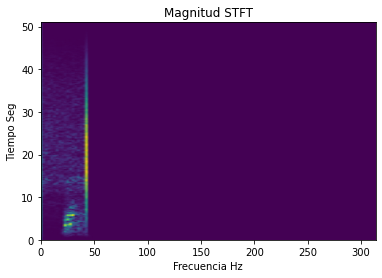

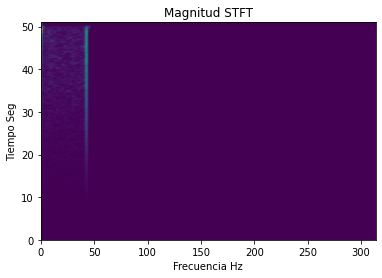

STFT para las señales: 14


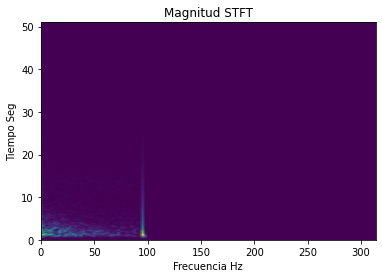

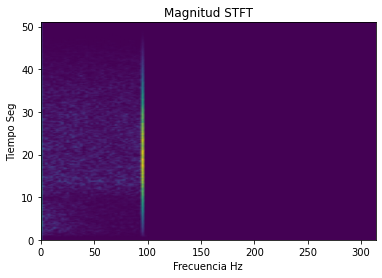

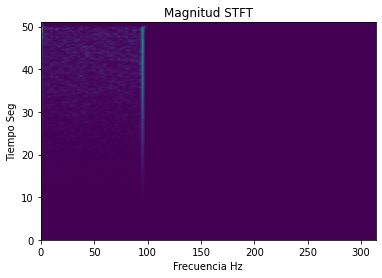

STFT para las señales: 15


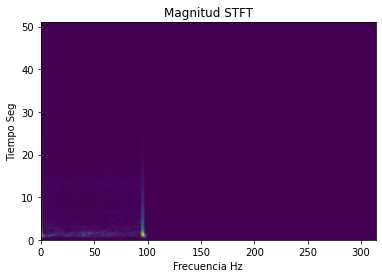

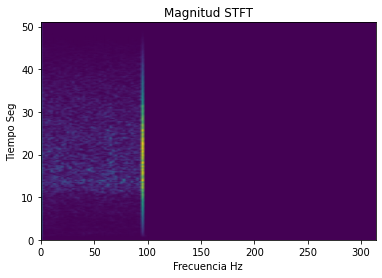

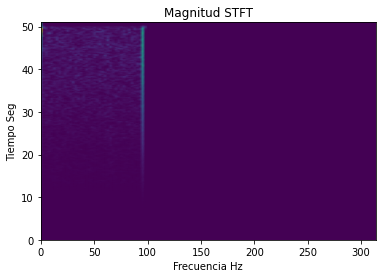

STFT para las señales: 16


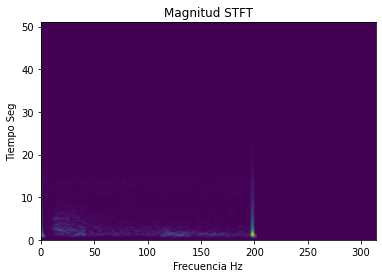

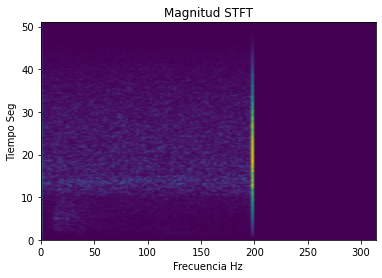

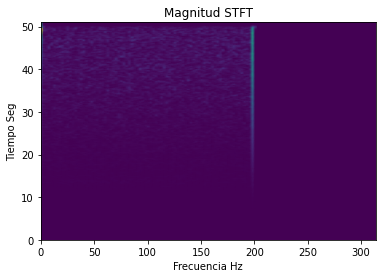

STFT para las señales: 17


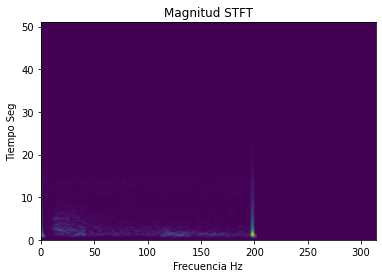

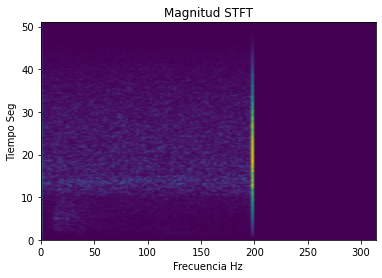

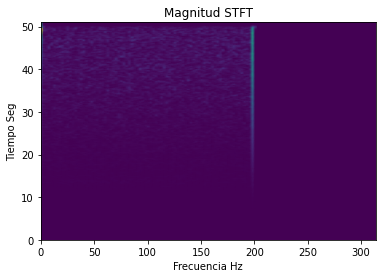

STFT para las señales: 18


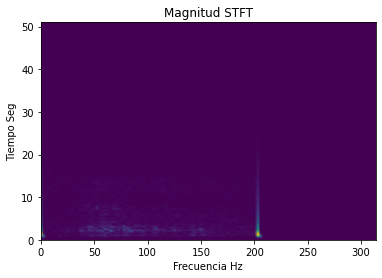

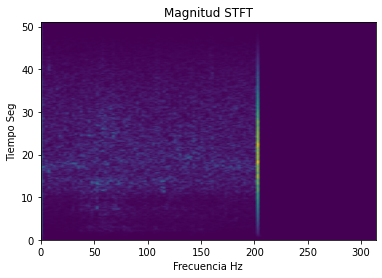

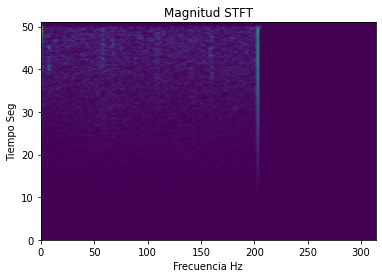

STFT para las señales: 19


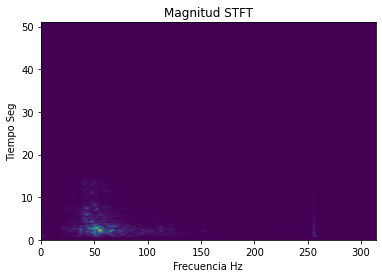

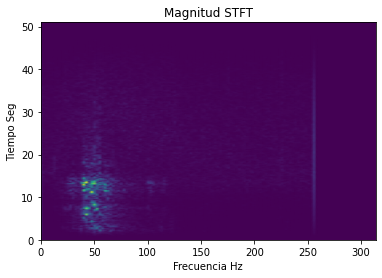

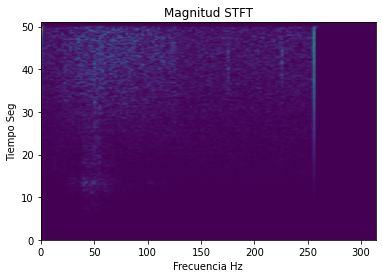

STFT para las señales: 20


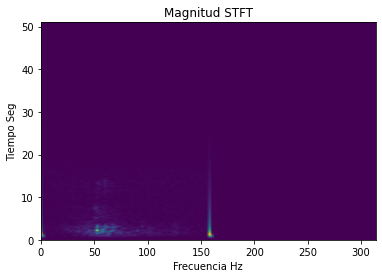

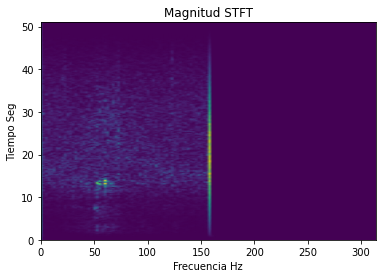

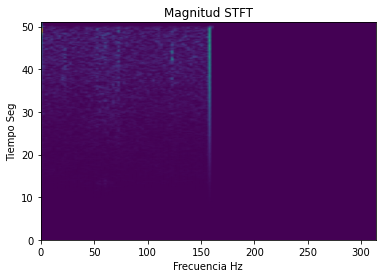

STFT para las señales: 21


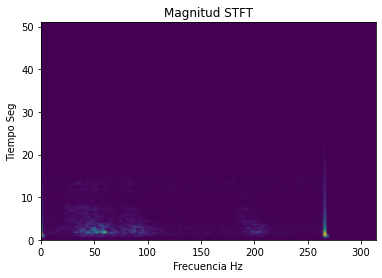

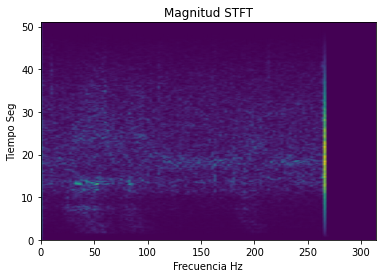

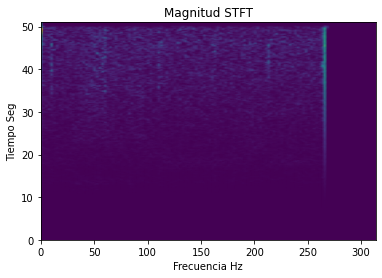

In [24]:
#-----------------------------------------------Analisis en Frecuencia
#STFT
for i in range (0,21):
  print('STFT para las señales:', i+1)
  for j in range (0,3):
    fT,tT,ZxxT= signal.stft(TELESISMOssa[i,j],fs,nperseg=512)
    absZxx = np.abs(ZxxT)
    plt.pcolormesh(tT,fT,absZxx, shading='gouraud')
    plt.title('Magnitud STFT')
    plt.xlabel('Frecuencia Hz')
    plt.ylabel('Tiempo Seg')
    plt.show()

In [25]:
datosTele=np.zeros((21,21))
for i in range (0,21):
  datofila = np.zeros((0,0))
  for j in range (0,3):
    fT,tT,ZxxT= signal.stft(TELESISMOssa[i,j],fs,nperseg=512)
    DATOS = extract_features(ZxxT,fT,TELESISMOssa[i,j])
    datofila = np.append(datofila,DATOS) 
  datosTele[i:] = datofila
print( datosTele)

[[1.33784363e-02 2.31093750e+01 1.37640271e+01 2.84000510e-03
  4.93672677e-06 1.33784363e-02 2.88320013e-04 2.19514128e-02
  1.19531250e+00 1.03661013e+01 3.16585196e-03 1.14728777e-05
  2.19514128e-02 4.11794077e-04 1.15923199e-02 4.44257812e+01
  1.04767150e+01 2.94447417e-03 6.16676463e-06 1.15923199e-02
  8.61390564e-06]
 [1.33784363e-02 2.31093750e+01 1.37640271e+01 2.84000510e-03
  4.93672677e-06 1.33784363e-02 2.88320013e-04 2.19514128e-02
  1.19531250e+00 1.03661013e+01 3.16585196e-03 1.14728777e-05
  2.19514128e-02 4.11794077e-04 1.15923199e-02 4.44257812e+01
  1.04767150e+01 2.94447417e-03 6.16676463e-06 1.15923199e-02
  8.61390564e-06]
 [1.33784363e-02 2.31093750e+01 1.37640271e+01 2.84000510e-03
  4.93672677e-06 1.33784363e-02 2.88320013e-04 2.19514128e-02
  1.19531250e+00 1.03661013e+01 3.16585196e-03 1.14728777e-05
  2.19514128e-02 4.11794077e-04 1.15923199e-02 4.44257812e+01
  1.04767150e+01 2.94447417e-03 6.16676463e-06 1.15923199e-02
  8.61390564e-06]
 [1.33784363e-02

In [26]:
print(datosTele.size)

441


# Unir Todo

In [27]:
Matriz = np.concatenate((datosLoc,datosReg,datosTele),axis=0)

In [28]:
df = pd.DataFrame(Matriz,columns=['Pmax','F_Pmax', 'Energia','Media','Var','Max','Min','Pmax1','F_Pmax1','Energia1','Media1','Var1','Max1','Min1','Pmax2','F_Pmax2','Energia2','Media2','Var2','Max2','Min2'])

In [29]:
df

,Pmax,F_Pmax,Energia,Media,Var,Max,Min,Pmax1,F_Pmax1,Energia1,Media1,Var1,Max1,Min1,Pmax2,F_Pmax2,Energia2,Media2,Var2,Max2,Min2
0,0.030815,1.394531,5.855927,0.003373,0.000024,0.030815,0.000112,0.011026,24.105469,1.893424,0.001428,1.847116e-06,0.011026,0.000108,0.009941,49.605469,1.463668,0.001536,3.741860e-06,0.009941,0.000008
1,0.035075,1.394531,6.951165,0.003884,0.000031,0.035075,0.000233,0.004967,29.882812,0.815062,0.001353,7.167863e-07,0.004967,0.000265,0.008499,49.804688,0.993923,0.001201,1.741841e-06,0.008499,0.000027
2,0.020227,49.605469,3.078064,0.002943,0.000012,0.020227,0.000059,0.015229,1.394531,1.709706,0.002392,6.438910e-06,0.015229,0.000153,0.007327,30.281250,1.058124,0.002190,3.214555e-06,0.007327,0.000106
3,0.020227,49.605469,3.078064,0.002943,0.000012,0.020227,0.000059,0.015229,1.394531,1.709706,0.002392,6.438910e-06,0.015229,0.000153,0.007327,30.281250,1.058124,0.002190,3.214555e-06,0.007327,0.000106
4,0.034581,1.394531,6.757857,0.003863,0.000031,0.034581,0.000210,0.008165,45.820312,0.757508,0.001185,2.296994e-06,0.008165,0.000033,0.003967,16.933594,0.356890,0.001191,4.381503e-07,0.003967,0.000240
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58,0.036806,1.394531,10.963222,0.004043,0.000035,0.036806,0.000274,0.001947,18.527344,0.205753,0.001050,2.859948e-07,0.001947,0.000267,0.002866,49.605469,0.123171,0.000691,4.023552e-07,0.002866,0.000029
59,0.038717,1.394531,10.349221,0.004198,0.000038,0.038717,0.000302,0.002181,18.328125,0.282746,0.001109,3.122868e-07,0.002181,0.000301,0.002874,49.406250,0.200473,0.000728,4.446188e-07,0.002874,0.000028
60,0.157007,2.390625,141.169174,0.008944,0.000472,0.157007,0.000208,0.006573,13.546875,0.812603,0.001193,1.656969e-06,0.006573,0.000170,0.001712,49.406250,0.108195,0.000409,1.265937e-07,0.001712,0.000013
61,0.035714,1.394531,11.021017,0.003911,0.000034,0.035714,0.000295,0.001980,13.945312,0.224016,0.001027,2.671730e-07,0.001980,0.000280,0.002761,49.406250,0.154527,0.000672,3.814931e-07,0.002761,0.000028


In [30]:
Etiquetas = np.zeros((63,1))
Etiquetas[0:21] = 0
Etiquetas[21:42] = 1
Etiquetas[42:] = 2


In [31]:
df['Etiquetas'] = Etiquetas


In [32]:
df

,Pmax,F_Pmax,Energia,Media,Var,Max,Min,Pmax1,F_Pmax1,Energia1,Media1,Var1,Max1,Min1,Pmax2,F_Pmax2,Energia2,Media2,Var2,Max2,Min2,Etiquetas
0,0.030815,1.394531,5.855927,0.003373,0.000024,0.030815,0.000112,0.011026,24.105469,1.893424,0.001428,1.847116e-06,0.011026,0.000108,0.009941,49.605469,1.463668,0.001536,3.741860e-06,0.009941,0.000008,0.0
1,0.035075,1.394531,6.951165,0.003884,0.000031,0.035075,0.000233,0.004967,29.882812,0.815062,0.001353,7.167863e-07,0.004967,0.000265,0.008499,49.804688,0.993923,0.001201,1.741841e-06,0.008499,0.000027,0.0
2,0.020227,49.605469,3.078064,0.002943,0.000012,0.020227,0.000059,0.015229,1.394531,1.709706,0.002392,6.438910e-06,0.015229,0.000153,0.007327,30.281250,1.058124,0.002190,3.214555e-06,0.007327,0.000106,0.0
3,0.020227,49.605469,3.078064,0.002943,0.000012,0.020227,0.000059,0.015229,1.394531,1.709706,0.002392,6.438910e-06,0.015229,0.000153,0.007327,30.281250,1.058124,0.002190,3.214555e-06,0.007327,0.000106,0.0
4,0.034581,1.394531,6.757857,0.003863,0.000031,0.034581,0.000210,0.008165,45.820312,0.757508,0.001185,2.296994e-06,0.008165,0.000033,0.003967,16.933594,0.356890,0.001191,4.381503e-07,0.003967,0.000240,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58,0.036806,1.394531,10.963222,0.004043,0.000035,0.036806,0.000274,0.001947,18.527344,0.205753,0.001050,2.859948e-07,0.001947,0.000267,0.002866,49.605469,0.123171,0.000691,4.023552e-07,0.002866,0.000029,2.0
59,0.038717,1.394531,10.349221,0.004198,0.000038,0.038717,0.000302,0.002181,18.328125,0.282746,0.001109,3.122868e-07,0.002181,0.000301,0.002874,49.406250,0.200473,0.000728,4.446188e-07,0.002874,0.000028,2.0
60,0.157007,2.390625,141.169174,0.008944,0.000472,0.157007,0.000208,0.006573,13.546875,0.812603,0.001193,1.656969e-06,0.006573,0.000170,0.001712,49.406250,0.108195,0.000409,1.265937e-07,0.001712,0.000013,2.0
61,0.035714,1.394531,11.021017,0.003911,0.000034,0.035714,0.000295,0.001980,13.945312,0.224016,0.001027,2.671730e-07,0.001980,0.000280,0.002761,49.406250,0.154527,0.000672,3.814931e-07,0.002761,0.000028,2.0


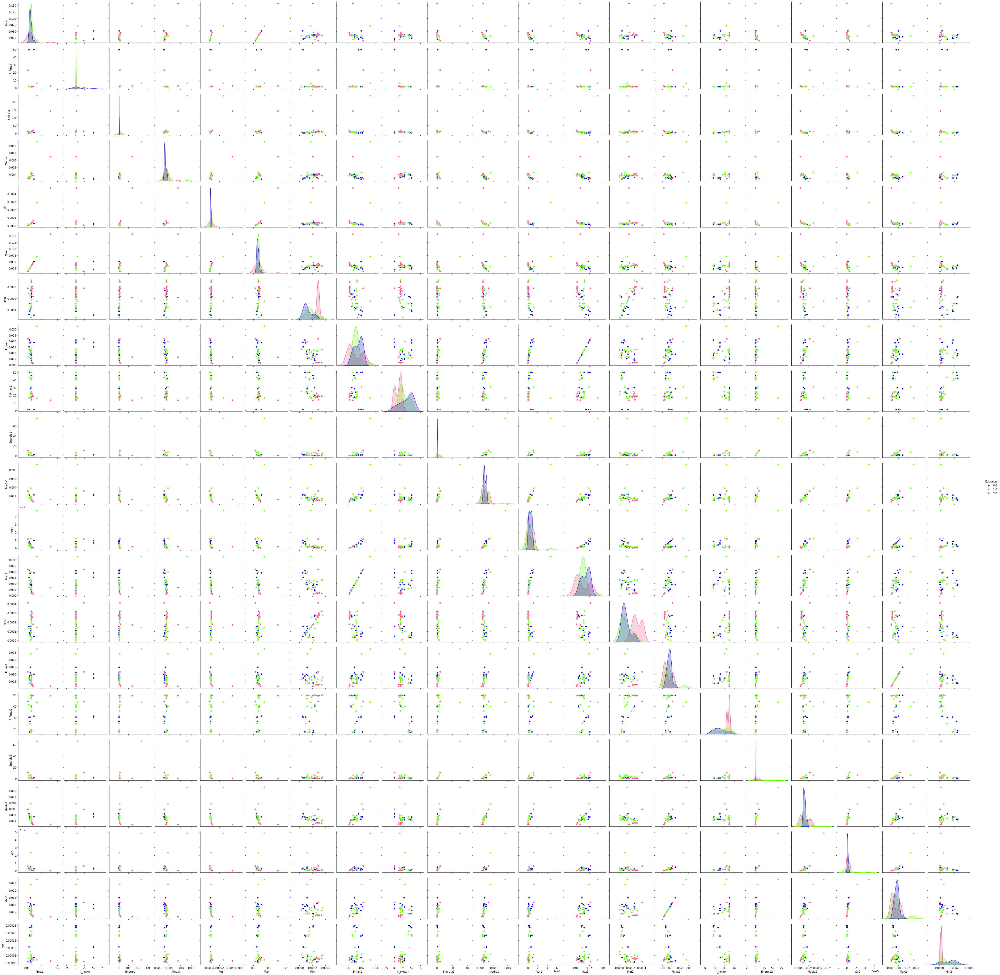

In [33]:
color = ["#0002d5","#67ff00","#ff4d80"]
sns.pairplot(df, hue="Etiquetas",height=2.5, palette=color)